Join the data from Part 1 with the data from Part 2 to create a new dataframe.

In [2]:
import pandas as pd
import sqlite3 as sqlite
import numpy as np
import folium

In [3]:
foursquare = pd.read_csv('/Users/skylerwilson/Desktop/Lighthouse_Labs/Projects/statistical_modeling/data/foursquare_results.csv')
foursquare.head()


,business_id,name,category_id,category,address,latitude,longitude,tel,rating
0,57f53ed7498e23279caaed8e,Txotx,13003,Bar,"Trondheimsveien 2, 0560 Oslo",59.919337,10.759947,921 69 062,9.1
1,4d6803f3709bb60c63f9b014,Le Benjamin Bar & Bistro,13148,French Restaurant,Søndre gate 6 (mellom Markveien & Thorvald Mey...,59.918750,10.758048,22 35 79 44,9.4
2,547a5140498e356dc652cfb7,Territoriet,13025,Wine Bar,"Markveien 58, 0550 Oslo",59.918887,10.757560,950 23 894,8.8
3,4bd1eaae77b29c74bb8f8d82,Glød,13003,Bar,"Thorvald Meyers gate 70 A (Korsgata), 0552 Oslo",59.920272,10.759572,930 03 674,8.2
4,5547ba21498e3c063aa9a7ba,Bd57,13006,Beer Bar,"Markveien 57, 0550 Oslo",59.919910,10.757172,923 11 315,8.4


In [4]:
yelp = pd.read_csv('/Users/skylerwilson/Desktop/Lighthouse_Labs/Projects/statistical_modeling/data/yelp_results.csv')
yelp.head()
len(yelp)

7929

In [5]:
#read in the bike sattion data
bike_stations_df = pd.read_csv('/Users/skylerwilson/Desktop/Lighthouse_Labs/Projects/statistical_modeling/data/stations_data.csv')
bike_stations_df.head()

,name,latitude,longitude,free bikes
0,Lille Schous plass,59.920259,10.760629,6
1,Sjølyst,59.921673,10.676660,15
2,Tøyenparken,59.915667,10.777567,4
3,Lindern,59.935888,10.735006,0
4,Uelands gate,59.929545,10.748986,10


<h5>Data cleaning and EDA<h5>

In [6]:
data_df = pd.concat([yelp, foursquare])
final_df = pd.concat([data_df, bike_stations_df])
final_df.tail()

,business_id,name,address,latitude,longitude,tel,rating,category_id,category,free bikes
258,NaN,Holbergs plass,NaN,59.919309,10.734305,NaN,NaN,NaN,NaN,3.0
259,NaN,Bjølsen mølle,NaN,59.939240,10.768771,NaN,NaN,NaN,NaN,0.0
260,NaN,Hasle,NaN,59.924342,10.792850,NaN,NaN,NaN,NaN,21.0
261,NaN,Ensjøveien,NaN,59.916622,10.783309,NaN,NaN,NaN,NaN,0.0
262,NaN,Ila,NaN,59.931828,10.748745,NaN,NaN,NaN,NaN,2.0


In [7]:
#create Bike station category and id
final_df.loc[final_df['free bikes'].notna(), 'category'] = 'Bike Station'
final_df.loc[final_df['free bikes'].notna(), 'category_id'] = 13999
final_df.tail()

,business_id,name,address,latitude,longitude,tel,rating,category_id,category,free bikes
258,NaN,Holbergs plass,NaN,59.919309,10.734305,NaN,NaN,13999.0,Bike Station,3.0
259,NaN,Bjølsen mølle,NaN,59.939240,10.768771,NaN,NaN,13999.0,Bike Station,0.0
260,NaN,Hasle,NaN,59.924342,10.792850,NaN,NaN,13999.0,Bike Station,21.0
261,NaN,Ensjøveien,NaN,59.916622,10.783309,NaN,NaN,13999.0,Bike Station,0.0
262,NaN,Ila,NaN,59.931828,10.748745,NaN,NaN,13999.0,Bike Station,2.0


In [8]:
#impute restaurant and restaurant category
final_df.loc[final_df['category'].isna(), 'category'] = 'Restaurant'
final_df.head()
final_df.loc[final_df['category'] == 'Restaurant', 'category_id'] = 13065
final_df['category'].value_counts()

category
Restaurant                     8167
Bike Station                    263
Fast Food Restaurant            119
Cafe, Coffee, and Tea House     103
Pizzeria                         92
                               ... 
Colombian Restaurant              1
Falafel Restaurant                1
Comedy Club                       1
Arcade                            1
Noodle Restaurant                 1
Name: count, Length: 89, dtype: int64

In [9]:
#drop rows where longitude or latitude is NaN
final_df.dropna(subset=['latitude', 'longitude'], inplace=True)

In [10]:
#ensure that the database is clean
final_df['category'].isna().value_counts()

category
False    9444
Name: count, dtype: int64

In [11]:
import re
#inspect the telephone column to see if its worth keeping
final_df['tel'].isna().value_counts()

#use regex to see how many phone numbers dont have the correct number of digits

expected_digits = 10

# Define the regex pattern to match the expected number of digits
pattern = r"^\d{" + str(expected_digits) + r"}$"

invalid_count = 0
valid_count = 0
for number in final_df['tel'].astype(str):
    if not re.match(pattern, number):
        invalid_count += 1
    else:
        valid_count += 1
print(f'invalid numbers: {invalid_count}\nValid numbers: {valid_count}')

final_df['tel'].isna().value_counts()

invalid numbers: 9444
Valid numbers: 0


tel
False    7997
True     1447
Name: count, dtype: int64

In [12]:
#drop the tel column
final_df.drop('tel', axis=1, inplace=True)

In [13]:
final_df.describe()
final_df[(final_df['rating'].isna() == False) & (final_df['category'] != 'Bike Station')].describe()

,latitude,longitude,rating,category_id,free bikes
count,8307.000000,8307.000000,8307.000000,8307.000000,0.0
mean,59.921236,10.743818,4.517010,13060.553991,NaN
std,0.010010,0.021695,0.887906,139.842093,NaN
min,59.896655,10.635312,1.000000,10000.000000,NaN
25%,59.913850,10.726814,4.000000,13065.000000,NaN
50%,59.919171,10.746730,4.500000,13065.000000,NaN
75%,59.927564,10.759157,5.000000,13065.000000,NaN
max,59.956020,10.819265,9.400000,13383.000000,NaN


In [14]:
#see how many non bike stations had a NaN rating
final_df[(final_df['rating'].isna() == True) & (final_df['category'] != 'Bike Station')]

#impute the NaN ratings with the rating mean
final_df['rating'] = final_df['rating'].fillna(final_df['rating'].mean())
final_df.describe()

,latitude,longitude,rating,category_id,free bikes
count,9444.000000,9444.000000,9444.000000,9444.000000,263.000000
mean,59.921631,10.743949,4.517010,13081.018636,9.003802
std,0.010417,0.024836,0.832738,272.026277,8.327962
min,59.894918,10.635136,1.000000,10000.000000,0.000000
25%,59.913873,10.725900,4.000000,13065.000000,1.000000
50%,59.919470,10.746864,4.500000,13065.000000,7.000000
75%,59.928087,10.759899,4.517010,13065.000000,14.000000
max,59.959953,10.827531,9.400000,13999.000000,35.000000


In [15]:
from geopy.geocoders import Nominatim
#generate an address from the longitude and latitude for the bike sttations

subset = final_df[final_df['address'].isna() == True]
subset.head()

geolocator = Nominatim(user_agent="my-app")

#use reverse geolocation to assign addresses to rows that have a latitude and longitude but no listed address
for index, row in subset.iterrows():
    latitude = row['latitude']
    longitude = row['longitude']
    location = geolocator.reverse(f"{latitude}, {longitude}")
    if location is not None:
        final_df.at[index, 'address'] = location.address
final_df.head()

,business_id,name,address,latitude,longitude,rating,category_id,category,free bikes
0,0_2TaPyt9IR2wfnSqqGSRw,GazaKjøkken,"Øvingshotellet, Korsgata, Fredensborg, Grünerl...",59.914452,10.747173,5.0,13065.0,Restaurant,NaN
1,cAG1s3UZosdF9e7WZzGMpg,Picasso Pizza,"Recharge Skøyen, Oslo kommune, Drammensveien, ...",59.928856,10.765174,5.0,13065.0,Restaurant,NaN
2,_udObTLAN6eJe35wTzt0sA,Stangeriet,"85, Økernveien, Marienfryd, Grünerløkka, Oslo,...",59.922359,10.751690,5.0,13065.0,Restaurant,NaN
3,aWTw_nG2eQmakTX_VumWrg,Syverkiosken,"Kirkeveien, Lindern, St. Hanshaugen, Oslo, 045...",59.928379,10.752430,5.0,13065.0,Restaurant,NaN
4,RpFugceRsP1bIUf-Rww5BA,La Villa Restaurant,"38, Uelands gate, Lovisenberg, St. Hanshaugen,...",59.912780,10.763910,5.0,13065.0,Restaurant,NaN


In [16]:
final_df['category_id'].value_counts()

category_id
13065.0    8124
13999.0     263
13145.0     119
13032.0     103
13064.0      92
           ... 
13133.0       1
13144.0       1
10010.0       1
10003.0       1
13315.0       1
Name: count, Length: 89, dtype: int64

In [17]:
#cast the category id from float to int
final_df['category_id'] = final_df['category_id'].astype(int)

final_df['rating'] = final_df['rating'].round(1)

In [18]:
final_df.head()

,business_id,name,address,latitude,longitude,rating,category_id,category,free bikes
0,0_2TaPyt9IR2wfnSqqGSRw,GazaKjøkken,"Øvingshotellet, Korsgata, Fredensborg, Grünerl...",59.914452,10.747173,5.0,13065,Restaurant,NaN
1,cAG1s3UZosdF9e7WZzGMpg,Picasso Pizza,"Recharge Skøyen, Oslo kommune, Drammensveien, ...",59.928856,10.765174,5.0,13065,Restaurant,NaN
2,_udObTLAN6eJe35wTzt0sA,Stangeriet,"85, Økernveien, Marienfryd, Grünerløkka, Oslo,...",59.922359,10.751690,5.0,13065,Restaurant,NaN
3,aWTw_nG2eQmakTX_VumWrg,Syverkiosken,"Kirkeveien, Lindern, St. Hanshaugen, Oslo, 045...",59.928379,10.752430,5.0,13065,Restaurant,NaN
4,RpFugceRsP1bIUf-Rww5BA,La Villa Restaurant,"38, Uelands gate, Lovisenberg, St. Hanshaugen,...",59.912780,10.763910,5.0,13065,Restaurant,NaN


In [26]:
final_df.describe()

,latitude,longitude,rating,category_id,free bikes
count,9444.000000,9444.000000,9444.000000,9444.000000,263.000000
mean,59.921631,10.743949,4.514962,13081.018636,9.003802
std,0.010417,0.024836,0.832756,272.026277,8.327962
min,59.894918,10.635136,1.000000,10000.000000,0.000000
25%,59.913873,10.725900,4.000000,13065.000000,1.000000
50%,59.919470,10.746864,4.500000,13065.000000,7.000000
75%,59.928087,10.759899,4.500000,13065.000000,14.000000
max,59.959953,10.827531,9.400000,13999.000000,35.000000


In [19]:
final_df['category'].value_counts()

category
Restaurant                     8124
Bike Station                    263
Fast Food Restaurant            119
Cafe, Coffee, and Tea House     103
Pizzeria                         92
                               ... 
Colombian Restaurant              1
Falafel Restaurant                1
Comedy Club                       1
Arcade                            1
Noodle Restaurant                 1
Name: count, Length: 89, dtype: int64

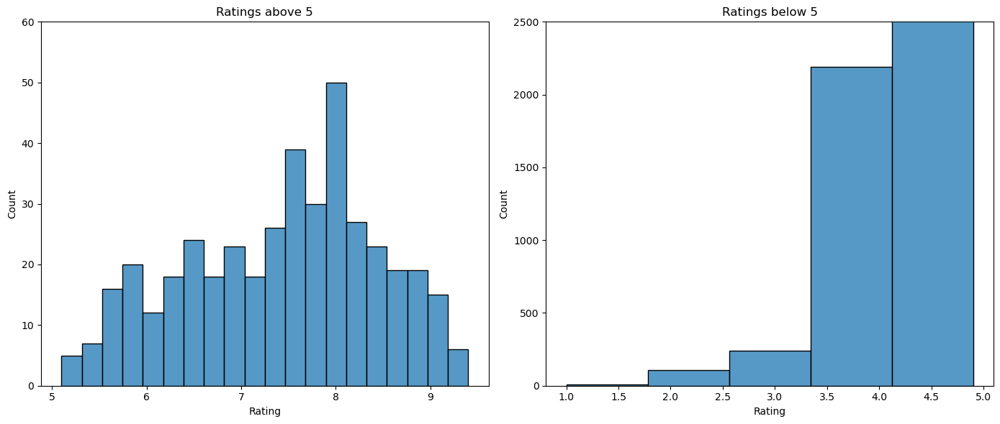

In [20]:
import seaborn as sns
import matplotlib.pyplot as plt

#seperated above 5 and below 5 to give a better visual

# Rating mask for ratings above 5
rate_mask_above_5 = final_df[(final_df['rating'].isna() == False) & (final_df['rating'] > 5)]

# Rating mask for ratings below 5
rate_mask_below_5 = final_df[(final_df['rating'].isna() == False) & (final_df['rating'] < 5)]

# Create subplots with 1 row and 2 columns
fig, axs = plt.subplots(1, 2, figsize=(14, 6))

# Subplot 1: Ratings above 5
sns.histplot(data=rate_mask_above_5, x='rating', ax=axs[0], bins=20)
axs[0].set_title('Ratings above 5')
axs[0].set_xlabel('Rating')
axs[0].set_ylabel('Count')
axs[0].set_ylim(0, 60)

# Subplot 2: Ratings below 5
sns.histplot(data=rate_mask_below_5, x='rating', ax=axs[1], bins=5)
axs[1].set_title('Ratings below 5')
axs[1].set_xlabel('Rating')
axs[1].set_ylabel('Count')
axs[1].set_ylim(0, 2500)

# Adjust spacing between subplots
plt.tight_layout()

# Display the subplots
plt.show()

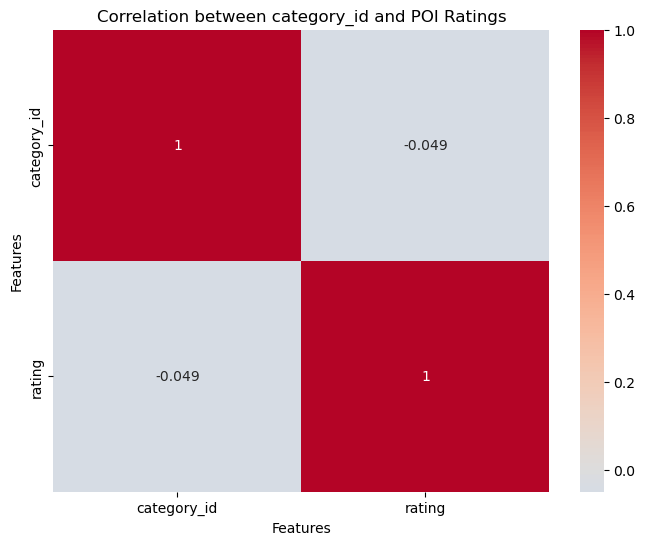

In [21]:
# Filter the relevant columns from the dataframe

data_subset = final_df[['category_id', 'rating']]


# Compute the correlation matrix
corr_matrix = data_subset.corr()

# Create a heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', center=0)

# Customize the plot
plt.title('Correlation between category_id and POI Ratings')
plt.xlabel('Features')
plt.ylabel('Features')

# Display the plot
plt.show()


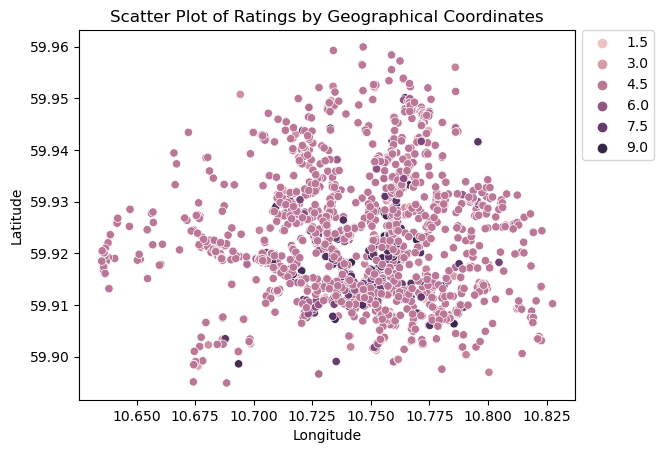

In [22]:
data_filtered = final_df[final_df['rating'].isna() == False]

# Create a scatter plot using Seaborn
sns.scatterplot(data=data_filtered, x='longitude', y='latitude', hue='rating')

# Customize the plot
plt.title('Scatter Plot of Ratings by Geographical Coordinates')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.824))

# Display the plot
plt.show()

Provide a visualization that you used as part of your EDA process. Explain the initial pattern or relationship you discoved through this visualization. 

In [25]:
# Create a folium map of Oslo Norway
map = folium.Map(location=[59.9139, 10.7522], zoom_start=15)

#colour coded popular POI's and defaulted everything else to blue
category_colors = {
    'Bike Station': 'lightgreen',
    'Restaurant': 'lightblue',
    'Bar': 'pink',
    'Fast Food Restaurant': 'darkred',
    'Cafe, Coffee, and Tea House': 'black'

      # Add more categories and their corresponding colors
}

default_colour = 'blue'
# Iterate over your data points and add markers to the map
for index, row in final_df.iterrows():
    # Extract the latitude and longitude values from your data
    latitude = row['latitude']
    longitude = row['longitude']
    
    # Get the category of the location
    category = row['category']
    
    # Get the corresponding marker color for the category
    marker_color = category_colors.get(category, default_colour)
    
    # Create a marker with a popup containing information about the location
    popup_text = f"Venue: {row['name']}\nCategory: {category}\nAddress: {row['address']}\nRating: {row['rating']}"
    marker = folium.Marker([latitude, longitude], 
                           popup=popup_text,
                           icon=folium.Icon(color=marker_color),
                          )
    
    # Add the marker to the map
    marker.add_to(map)
map.save("map.html")
#show the map
map

The map created above is used to show visually the proximity of POI's to the bike stations in Oslo, Norway. I chose the map because it is a nice visual display of the database and having it overlayed on the streets makes the geographic portion of the data more concrete. 


In [ ]:
final_df.to_csv('poi_api_data.csv')

# Database

Put all your results in an SQLite3 database (remember, SQLite stores its databases as files in your local machine - make sure to create your database in your project's data/ directory!)

In [37]:
conn = sqlite.connect('api_data.db')

# Create a cursor object to execute SQL statements
cursor = conn.cursor()

# Create the categories table
cursor.execute("""CREATE TABLE IF NOT EXISTS categories (
                    category_id INTEGER PRIMARY KEY,
                    category TEXT
                );
""")

# Insert unique category IDs and categories into the categories table
categories = final_df[['category_id', 'category']].drop_duplicates()

for _, row in categories.iterrows():
    category_id = row['category_id']
    category = row['category']

    # Insert the current row into the categories table
    cursor.execute("INSERT OR IGNORE INTO categories (category_id, category) VALUES (?, ?)",
                   (category_id, category))


cursor.execute("DROP TABLE IF EXISTS bike_stations;")
cursor.execute("""
    CREATE TABLE bike_stations (
        station_id INTEGER PRIMARY KEY AUTOINCREMENT,
        station_name VARCHAR,
        address VARCHAR,
        latitude REAL,
        longitude REAL,
        num_bikes_available INTEGER,
        category_id INTEGER,
        FOREIGN KEY (category_id) REFERENCES categories(category_id)
    );
""")

bikes = final_df[final_df['free bikes'].isna() == False]

# Insert data into the bike_stations table, including the category_id
for _, row in bikes.iterrows():
    station_name = row['name']
    address = row['address']
    latitude = row['latitude']
    longitude = row['longitude']
    free_bikes = row['free bikes']
    category_id = row['category_id']

    # Insert the current row into the bike_stations table
    cursor.execute("INSERT INTO bike_stations (station_name, address, latitude, longitude, num_bikes_available, category_id) VALUES (?, ?, ?, ?, ?, ?)",
                   (station_name, address, latitude, longitude, free_bikes, category_id))


cursor.execute("DROP TABLE IF EXISTS poi_data;")


cursor.execute("""CREATE TABLE IF NOT EXISTS poi_data (
                    business_id VARCHAR PRIMARY KEY,
                    poi_name VARCHAR, 
                    category_id INTEGER,
                    address VARCHAR,
                    latitude REAL,
                    longitude REAL,
                    rating REAL,
                    FOREIGN KEY (category_id) REFERENCES categories (category_id)
)
""")

businesses = final_df[final_df["business_id"].isna() == False]
businesses.drop_duplicates(subset='business_id', inplace=True)

for _, row in businesses.iterrows():
    business_id = row['business_id']
    poi_name = row['name']
    address = row['address']
    latitude = row['latitude']
    longitude = row['longitude']
    rating = row['rating']
    category_id = row['category_id']

    # Insert the current row into the poi_data table
    cursor.execute("INSERT INTO poi_data (business_id, poi_name, address, latitude, longitude, rating, category_id) VALUES (?, ?, ?, ?, ?, ?,?)",
                   (business_id, poi_name, address, latitude, longitude, rating, category_id))

# Commit the changes and close the connection
conn.commit()

conn.close()



# Commit the changes and close the connection

#location table which will be for the restaurants and the bike locations

/var/folders/59/vc05kjdn7s14r9w654dq4xlh0000gn/T/ipykernel_13562/3304242462.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  businesses.drop_duplicates(subset='business_id', inplace=True)


Look at the data before and after the join to validate your data.

In [30]:
conn = sqlite.connect('api_data.db')

# Create a cursor object to execute SQL statements
cursor = conn.cursor()

cursor.execute("SELECT COUNT(*) FROM poi_data")
poi_count = cursor.fetchone()[0]
print(poi_count)
cursor.execute("SELECT COUNT(*) FROM bike_stations")
bs_count = cursor.fetchone()[0]
print(bs_count)
cursor.execute("SELECT COUNT(*) FROM categories")
cat_count = cursor.fetchone()[0]
print(cat_count)
final_count = bs_count + poi_count
print(f'DB shape: {final_count}')

shape = final_df.shape[0]
print(f'DF shape: {shape}')

1984
263
89
DB shape: 2247
DF shape: 9444


In [62]:
conn = sqlite.connect('api_data.db')

# Create a cursor object to execute SQL statements
cursor = conn.cursor()

cursor.execute("""
    SELECT b.address, SUM(b.num_bikes_available)
    FROM bike_stations b
    GROUP BY b.address
""" )
bikes_by_address = cursor.fetchall()

cursor.execute("""
    SELECT p.address, c.category
    FROM categories c
    JOIN poi_data p
    ON p.category_id = c.category_id
    GROUP BY p.address, c.category
""" )
category_address = cursor.fetchall()

cursor.execute("""
SELECT address, num_bikes_available, avg_free_bikes
FROM (
  SELECT address, num_bikes_available, AVG(num_bikes_available) OVER () AS avg_free_bikes
  FROM bike_stations
) subquery
WHERE num_bikes_available >= avg_free_bikes;
""" )
avg_bikes = cursor.fetchall()

cursor.execute("""
SELECT address, rating, avg_rating, category
FROM (
  SELECT p.address, p.rating, c.category, AVG(p.rating) OVER (PARTITION BY c.category) AS avg_rating
  FROM poi_data p
  JOIN categories c
  ON c.category_id = p.category_id
) subquery
WHERE rating >= avg_rating;
""" )
avg_rating_by_category = cursor.fetchall()

cursor.execute("""
    SELECT bs.address, bs.num_bikes_available, bs.avg_free_bikes,
       CASE 
         WHEN bs.latitude BETWEEN b.min_latitude AND b.max_latitude
           AND bs.longitude BETWEEN b.min_longitude AND b.max_longitude
         THEN 1
         ELSE 2
       END AS latitude_longitude_group
    FROM (
      SELECT AVG(latitude) AS min_latitude, MAX(latitude) AS max_latitude,
            AVG(longitude) AS min_longitude, MAX(longitude) AS max_longitude
      FROM bike_stations
    ) b
    JOIN (
      SELECT address, num_bikes_available, AVG(num_bikes_available) OVER () AS avg_free_bikes,
            latitude, longitude
      FROM bike_stations
    ) bs ON 1 = 1
    GROUP BY bs.address, bs.num_bikes_available, bs.avg_free_bikes, bs.latitude, bs.longitude, latitude_longitude_group;

""")
cursor.fetchall()





[('1, John Colletts allé, Ullevål hageby, Nordre Aker, Oslo, 0852, Norge',
  1,
  9.003802281368822,
  2),
 ('1, Sørligata, Barcode, Gamle Oslo, Oslo, 0190, Norge',
  12,
  9.003802281368822,
  2),
 ('106A, Kirkeveien, Bolteløkka, St. Hanshaugen, Oslo, 0361, Norge',
  15,
  9.003802281368822,
  2),
 ('11, Bøkkerveien, Krydderhagen, Grünerløkka, Oslo, 0579, Norge',
  3,
  9.003802281368822,
  1),
 ('11, Sinsenveien, Frydenberg, Grünerløkka, Oslo, 0572, Norge',
  1,
  9.003802281368822,
  1),
 ('119B, Drammensveien, Solbakken, Frogner, Oslo, 0273, Norge',
  14,
  9.003802281368822,
  2),
 ('12, Sofienberggata, Fredensborg, Grünerløkka, Oslo, 0558, Norge',
  12,
  9.003802281368822,
  1),
 ('13, Parkveien, Homansbyen, Frogner, Oslo, 0350, Norge',
  0,
  9.003802281368822,
  2),
 ('13, Valkyriegata, Hegdehaugen, Frogner, Oslo, 0366, Norge',
  2,
  9.003802281368822,
  2),
 ('15, Kirkegata, Akershus festning, Sentrum, Oslo, 0153, Norge',
  10,
  9.003802281368822,
  2),
 ('15, Løkkeveien, T